In [36]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
import warnings
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX
import pickle


import datetime
import sys
import os
import openpyxl
import xlrd

In [37]:
df = pd.read_csv('Econ_Project_Data_Consolidated.csv')
df.head(5)

,Date,Average_Hourly_Earning,Trade_Volume_Pct_Change_Index_Value,US_Crude_Oil_Prices_Dollar_Per_Barrel,Federal_Rates_Monthly,CPI_Value_Inflation,Nominal_Broad_US_Dollar_Index,producer_price_index_all_commodities,Adjusted_Closing_Price,US_Export_to_Russia,US_Unemployment_Rate,US_Consumer_Sentiment,US_Gasoline_Dollars_Per_Barrel,Price,US_Mean_Monthly_Market_Volatility,Russia_Ukraine_Date_Flag,Covid_Flag
0,2013-01-01,23.75,0.004045,95.00,0.14,230.280,90.8255,202.5,1498.11,692.919960,8.0,73.8,3.319,30.030,13.505238,0,0
1,2013-02-01,23.78,-0.000250,95.01,0.15,232.166,91.5509,204.3,1514.68,1008.624490,7.7,77.6,3.670,30.650,14.072632,0,0
2,2013-03-01,23.80,0.009400,95.54,0.14,232.773,92.4132,204.0,1569.19,917.892441,7.5,78.6,3.711,31.078,13.031500,0,0
3,2013-04-01,23.87,-0.002476,94.41,0.15,232.531,92.0478,203.5,1597.57,1087.226442,7.6,76.4,3.570,31.128,13.967273,0,0
4,2013-05-01,23.89,-0.003095,94.75,0.11,232.945,92.5290,204.1,1630.74,781.571515,7.5,84.5,3.615,31.922,13.493636,0,0


In [38]:
df.columns

Index(['Date', 'Average_Hourly_Earning', 'Trade_Volume_Pct_Change_Index_Value',
       'US_Crude_Oil_Prices_Dollar_Per_Barrel', 'Federal_Rates_Monthly',
       'CPI_Value_Inflation', 'Nominal_Broad_US_Dollar_Index',
       'producer_price_index_all_commodities', 'Adjusted_Closing_Price',
       'US_Export_to_Russia', 'US_Unemployment_Rate', 'US_Consumer_Sentiment',
       'US_Gasoline_Dollars_Per_Barrel', 'Price',
       'US_Mean_Monthly_Market_Volatility', 'Russia_Ukraine_Date_Flag',
       'Covid_Flag'],
      dtype='object')

In [39]:
# drop the average_hourly_earning

# Null Value Check

In [40]:
df.isnull().sum()

Date                                     0
Average_Hourly_Earning                   0
Trade_Volume_Pct_Change_Index_Value      0
US_Crude_Oil_Prices_Dollar_Per_Barrel    0
Federal_Rates_Monthly                    0
CPI_Value_Inflation                      0
Nominal_Broad_US_Dollar_Index            0
producer_price_index_all_commodities     0
Adjusted_Closing_Price                   0
US_Export_to_Russia                      0
US_Unemployment_Rate                     0
US_Consumer_Sentiment                    0
US_Gasoline_Dollars_Per_Barrel           0
Price                                    0
US_Mean_Monthly_Market_Volatility        0
Russia_Ukraine_Date_Flag                 0
Covid_Flag                               0
dtype: int64

# Scaling

In [41]:
# columns_to_scale = [
#     'Average_Hourly_Earning', 
#     'Trade_Volume_Pct_Change_Index_Value',
#     'US_Crude_Oil_Prices_Dollar_Per_Barrel',
#     'Federal_Rates_Monthly',
#     'CPI_Value_Inflation',
#     'Nominal_Broad_US_Dollar_Index',
#     'producer_price_index_all_commodities',
#     'Adjusted_Closing_Price',
#     'US_Export_to_Russia',
#     'US_Unemployment_Rate',
#     'US_Consumer_Sentiment',
#     'US_Gasoline_Dollars_Per_Barrel',
#     'Price',
#     'US_Mean_Monthly_Market_Volatility'
# ]

# # Create a StandardScaler object
# scaler = StandardScaler()

# # Scale only the specified columns
# data_scaled = scaler.fit_transform(df[columns_to_scale])

# # Convert the scaled data back into a DataFrame
# data_scaled_df = pd.DataFrame(data_scaled, columns=columns_to_scale)

# # Combine the unscaled columns ('Date' and categorical variables) with the scaled data
# df = pd.concat([df[['Date', 'Russia_Ukraine_Date_Flag', 'Covid_Flag']], data_scaled_df], axis=1)

# # Display the first few rows of the final DataFrame
# df.head(5)

# Stationarity Check

In [42]:
from statsmodels.tsa.stattools import adfuller

# List of columns to exclude
exclude_columns = ['Date', 'Russia_Ukraine_Date_Flag', 'Covid_Flag']

# Filter out the columns to exclude
columns_to_check = [column for column in columns_to_scale if column not in exclude_columns]

# Check stationarity for each numerical time series
for column in columns_to_check:
    result = adfuller(df[column])  
    print(f'{column}:')
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('------------------------')

Average_Hourly_Earning:
ADF Statistic: 3.5628435535330225
p-value: 1.0
------------------------
Trade_Volume_Pct_Change_Index_Value:
ADF Statistic: -6.807181355405723
p-value: 2.1618032286539925e-09
------------------------
US_Crude_Oil_Prices_Dollar_Per_Barrel:
ADF Statistic: -2.450489118141321
p-value: 0.1279901020795472
------------------------
Federal_Rates_Monthly:
ADF Statistic: -1.76498621590328
p-value: 0.3979783266606238
------------------------
CPI_Value_Inflation:
ADF Statistic: 0.07839243350469895
p-value: 0.9645545029532504
------------------------
Nominal_Broad_US_Dollar_Index:
ADF Statistic: -2.0207874004708457
p-value: 0.2775335775485881
------------------------
producer_price_index_all_commodities:
ADF Statistic: -1.0207944186930158
p-value: 0.745604665123256
------------------------
Adjusted_Closing_Price:
ADF Statistic: 0.7920829397335022
p-value: 0.9915072910311484
------------------------
US_Export_to_Russia:
ADF Statistic: -0.8563959338776396
p-value: 0.8019926612

In [43]:
import warnings
from statsmodels.tsa.stattools import kpss

def kpss_test(series):
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning)  # Suppress warnings
        statistic, p_value, _, _ = kpss(series, regression='c', nlags="auto")
    return statistic, p_value

# List of columns to exclude
exclude_columns = ['Date', 'Russia_Ukraine_Date_Flag', 'Covid_Flag']

# Filter out the columns to exclude
columns_to_check = [column for column in columns_to_scale if column not in exclude_columns]

# Check stationarity for each numerical time series
for column in columns_to_check:  # Use the filtered list
    statistic, p_value = kpss_test(df[column])
    print(f'{column}:')
    print('KPSS Statistic:', statistic)
    print('p-value:', p_value)
    print('------------------------')

Average_Hourly_Earning:
KPSS Statistic: 2.0374107809371473
p-value: 0.01
------------------------
Trade_Volume_Pct_Change_Index_Value:
KPSS Statistic: 0.02294319041326101
p-value: 0.1
------------------------
US_Crude_Oil_Prices_Dollar_Per_Barrel:
KPSS Statistic: 0.3257592622395762
p-value: 0.1
------------------------
Federal_Rates_Monthly:
KPSS Statistic: 1.0238053372191858
p-value: 0.01
------------------------
CPI_Value_Inflation:
KPSS Statistic: 1.8884157153520382
p-value: 0.01
------------------------
Nominal_Broad_US_Dollar_Index:
KPSS Statistic: 1.585337208563348
p-value: 0.01
------------------------
producer_price_index_all_commodities:
KPSS Statistic: 1.3719745493563764
p-value: 0.01
------------------------
Adjusted_Closing_Price:
KPSS Statistic: 1.997393397310381
p-value: 0.01
------------------------
US_Export_to_Russia:
KPSS Statistic: 1.6263042085878263
p-value: 0.01
------------------------
US_Unemployment_Rate:
KPSS Statistic: 0.4489555179047807
p-value: 0.05605365607

### **Stationary Variables** (p-value < 0.05)

1. **Trade_Volume_Pct_Change_Index_Value**
2. **US_Unemployment_Rate**
3. **US_Mean_Monthly_Market_Volatility**

---

### **Non-Stationary Variables** (p-value ≥ 0.05)

1. **Average_Hourly_Earning**
2. **US_Crude_Oil_Prices_Dollar_Per_Barrel**
3. **Federal_Rates_Monthly**
4. **CPI_Value_Inflation**
5. **Nominal_Broad_US_Dollar_Index**
6. **producer_price_index_all_commodities**
7. **Adjusted_Closing_Price**
8. **US_Export_to_Russia**
9. **US_Consumer_Sentiment**
10. **US_Gasoline_Dollars_Per_Barrel**
11. **Price**

# Converting Non-Stationary to Stationary Dataset

In [44]:
import pandas as pd
import warnings
from statsmodels.tsa.stattools import adfuller, kpss

def check_stationarity_after_differencing(df, non_stationary_columns):
    # Create a copy of the original DataFrame to apply differencing
    df_diff = df.copy()
    
    # Perform first-order differencing
    for column in non_stationary_columns:
        df_diff[column] = df[column].diff()
    
    # Drop NaN values created by differencing
    df_diff = df_diff.dropna()
    
    # Function to perform ADF test
    def adf_test(series):
        result = adfuller(series)
        return result[0], result[1]  # Return ADF Statistic and p-value

    # Function to perform KPSS test with suppressed warnings
    def kpss_test(series):
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=UserWarning)
            statistic, p_value, _, _ = kpss(series, regression='c', nlags="auto")
        return statistic, p_value  # Return KPSS Statistic and p-value

    # List to store variables that are still not stationary
    not_stationary_after_diff = []

    # Check stationarity of each differenced variable and display results
    print("Stationarity Test Results after First Differencing:\n")
    for column in non_stationary_columns:
        adf_stat, adf_p_value = adf_test(df_diff[column])
        kpss_stat, kpss_p_value = kpss_test(df_diff[column])
        
        print(f'{column}:')
        print(f'  ADF Statistic: {adf_stat}, p-value: {adf_p_value}')
        print(f'  KPSS Statistic: {kpss_stat}, p-value: {kpss_p_value}')
        print('------------------------')
        
        # If either test indicates non-stationarity, add to the list
        if adf_p_value >= 0.05 or kpss_p_value < 0.05:
            not_stationary_after_diff.append(column)

    # Print the variables that are still not stationary
    if not_stationary_after_diff:
        print("\nVariables that are still not stationary after first differencing:")
        for var in not_stationary_after_diff:
            print(var)
    else:
        print("\nAll variables are stationary after first differencing.")

    # Return the differenced DataFrame
    return df_diff

In [45]:
non_stationary_columns = [
    'Average_Hourly_Earning',
    'Federal_Rates_Monthly',
    'CPI_Value_Inflation',
    'Nominal_Broad_US_Dollar_Index',
    'producer_price_index_all_commodities',
    'Adjusted_Closing_Price',
    'US_Export_to_Russia',
    'US_Consumer_Sentiment',
    'US_Gasoline_Dollars_Per_Barrel',
    'Price',
    'US_Mean_Monthly_Market_Volatility'
]

# Call the function with your DataFrame
df_diff = check_stationarity_after_differencing(df, non_stationary_columns)

Stationarity Test Results after First Differencing:

Average_Hourly_Earning:
  ADF Statistic: -9.781677234545953, p-value: 6.707562932246209e-17
  KPSS Statistic: 1.1938663043580595, p-value: 0.01
------------------------
Federal_Rates_Monthly:
  ADF Statistic: -3.200893900201676, p-value: 0.019932995036625167
  KPSS Statistic: 0.26164663575026526, p-value: 0.1
------------------------
CPI_Value_Inflation:
  ADF Statistic: -1.7273852394415694, p-value: 0.4170608627663752
  KPSS Statistic: 0.7410778984837649, p-value: 0.01
------------------------
Nominal_Broad_US_Dollar_Index:
  ADF Statistic: -7.322931318268208, p-value: 1.1811686880842598e-10
  KPSS Statistic: 0.13057465335675025, p-value: 0.1
------------------------
producer_price_index_all_commodities:
  ADF Statistic: -2.768473653100603, p-value: 0.06292010409565758
  KPSS Statistic: 0.24263323865378056, p-value: 0.1
------------------------
Adjusted_Closing_Price:
  ADF Statistic: -13.518134184104927, p-value: 2.7685174032461853

## Second Order Differencing for the Variables in question

In [46]:
def check_stationarity_after_second_differencing(df, variables_to_diff):
    # Create a copy of the DataFrame to apply second-order differencing
    df_diff = df.copy()

    # Perform second-order differencing
    for column in variables_to_diff:
        df_diff[column] = df[column].diff().diff()  # Second-order differencing

    # Drop NaN values created by second-order differencing
    df_diff = df_diff.dropna()

    # Function to perform ADF test
    def adf_test(series):
        result = adfuller(series)
        return result[0], result[1]  # Return ADF Statistic and p-value

    # Function to perform KPSS test with suppressed warnings
    def kpss_test(series):
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=UserWarning)
            statistic, p_value, _, _ = kpss(series, regression='c', nlags="auto")
        return statistic, p_value  # Return KPSS Statistic and p-value

    # List to store variables that are still not stationary
    not_stationary_after_second_diff = []

    # Check stationarity of each second-order differenced variable and display results
    print("Stationarity Test Results after Second-Order Differencing:\n")
    for column in variables_to_diff:
        adf_stat, adf_p_value = adf_test(df_diff[column])
        kpss_stat, kpss_p_value = kpss_test(df_diff[column])
        
        print(f'{column}:')
        print(f'  ADF Statistic: {adf_stat}, p-value: {adf_p_value}')
        print(f'  KPSS Statistic: {kpss_stat}, p-value: {kpss_p_value}')
        print('------------------------')
        
        # If either test indicates non-stationarity, add to the list
        if adf_p_value >= 0.05 or kpss_p_value < 0.05:
            not_stationary_after_second_diff.append(column)

    # Print the variables that are still not stationary
    if not_stationary_after_second_diff:
        print("\nVariables that are still not stationary after second-order differencing:")
        for var in not_stationary_after_second_diff:
            print(var)
    else:
        print("\nAll variables are stationary after second-order differencing.")

    # Return the second-order differenced DataFrame
    return df_diff

# Variables that need second-order differencing
variables_to_diff = [
    'Average_Hourly_Earning',
    'CPI_Value_Inflation',
    'producer_price_index_all_commodities'
]

# Call the function with your DataFrame
df_diff = check_stationarity_after_second_differencing(df, variables_to_diff)


Stationarity Test Results after Second-Order Differencing:

Average_Hourly_Earning:
  ADF Statistic: -7.900362311380503, p-value: 4.2011311494718324e-12
  KPSS Statistic: 0.10033107927788004, p-value: 0.1
------------------------
CPI_Value_Inflation:
  ADF Statistic: -7.483509627945427, p-value: 4.7043616569376275e-11
  KPSS Statistic: 0.15603775020333144, p-value: 0.1
------------------------
producer_price_index_all_commodities:
  ADF Statistic: -8.334770839186726, p-value: 3.294945654554372e-13
  KPSS Statistic: 0.08333084105398007, p-value: 0.1
------------------------

All variables are stationary after second-order differencing.


## Creating a Consolidated Stationary Dataset

In [47]:
import pandas as pd

def create_stationary_dataset(df):
    # Variables that became stationary after first differencing
    first_diff_columns = [
        'Trade_Volume_Pct_Change_Index_Value',
        'US_Crude_Oil_Prices_Dollar_Per_Barrel',
        'Federal_Rates_Monthly',
        'Nominal_Broad_US_Dollar_Index',
        'Adjusted_Closing_Price',
        'US_Export_to_Russia',
        'US_Unemployment_Rate',
        'US_Consumer_Sentiment',
        'US_Gasoline_Dollars_Per_Barrel',
        'Price',
        'US_Mean_Monthly_Market_Volatility'
    ]

    # Variables that became stationary after second differencing
    second_diff_columns = [
        'Average_Hourly_Earning',
        'CPI_Value_Inflation',
        'producer_price_index_all_commodities'
    ]

    # Excluded columns (Date and categorical flags)
    excluded_columns = ['Date', 'Russia_Ukraine_Date_Flag', 'Covid_Flag']

    # Create a copy of the original DataFrame
    df_final = df[excluded_columns].copy()

    # Apply first-order differencing
    for column in first_diff_columns:
        df_final[column] = df[column].diff()

    # Apply second-order differencing
    for column in second_diff_columns:
        df_final[column] = df[column].diff().diff()

    # Drop NaN values created by differencing
    df_final = df_final.dropna()

    return df_final

# Create the stationary dataset
df_final = create_stationary_dataset(df)

df_final.head(3)

,Date,Russia_Ukraine_Date_Flag,Covid_Flag,Trade_Volume_Pct_Change_Index_Value,US_Crude_Oil_Prices_Dollar_Per_Barrel,Federal_Rates_Monthly,Nominal_Broad_US_Dollar_Index,Adjusted_Closing_Price,US_Export_to_Russia,US_Unemployment_Rate,US_Consumer_Sentiment,US_Gasoline_Dollars_Per_Barrel,Price,US_Mean_Monthly_Market_Volatility,Average_Hourly_Earning,CPI_Value_Inflation,producer_price_index_all_commodities
2,2013-03-01,0,0,0.009650,0.53,-0.01,0.8623,54.51,-90.732049,-0.2,1.0,0.041,0.428,-1.041132,-0.01,-1.279,-2.1
3,2013-04-01,0,0,-0.011876,-1.13,0.01,-0.3654,28.38,169.334001,0.1,-2.2,-0.141,0.050,0.935773,0.05,-0.849,-0.2
4,2013-05-01,0,0,-0.000619,0.34,-0.04,0.4812,33.17,-305.654927,-0.1,8.1,0.045,0.794,-0.473636,-0.05,0.656,1.1


In [48]:
### Recheck the stationarity of all the columns
non_stationary_columns = [
    'Average_Hourly_Earning',
    'Federal_Rates_Monthly',
    'CPI_Value_Inflation',
    'Nominal_Broad_US_Dollar_Index',
    'producer_price_index_all_commodities',
    'Adjusted_Closing_Price',
    'US_Export_to_Russia',
    'US_Consumer_Sentiment',
    'US_Gasoline_Dollars_Per_Barrel',
    'Price',
    'US_Mean_Monthly_Market_Volatility'
]

# Call the function with your DataFrame
df_stat_check = check_stationarity_after_differencing(df_final, non_stationary_columns)

Stationarity Test Results after First Differencing:

Average_Hourly_Earning:
  ADF Statistic: -6.9029176382535855, p-value: 1.2684907887825943e-09
  KPSS Statistic: 0.08619201642827913, p-value: 0.1
------------------------
Federal_Rates_Monthly:
  ADF Statistic: -8.985881640900839, p-value: 7.1034653863418156e-15
  KPSS Statistic: 0.19033797033751385, p-value: 0.1
------------------------
CPI_Value_Inflation:
  ADF Statistic: -7.17217399458545, p-value: 2.7861445150834405e-10
  KPSS Statistic: 0.12537163692513814, p-value: 0.1
------------------------
Nominal_Broad_US_Dollar_Index:
  ADF Statistic: -6.751430587518096, p-value: 2.944295791792677e-09
  KPSS Statistic: 0.0447947483461493, p-value: 0.1
------------------------
producer_price_index_all_commodities:
  ADF Statistic: -7.222388989409859, p-value: 2.094937306181445e-10
  KPSS Statistic: 0.19318321233151042, p-value: 0.1
------------------------
Adjusted_Closing_Price:
  ADF Statistic: -9.389898925531433, p-value: 6.60413677237

In [49]:
# Export the Stationary Dataset
df_final.to_csv('Econ_Data_Stationary.csv')

# Plotting the Non-Stationary vs Stationary Timeseries

In [50]:
# import matplotlib.pyplot as plt

# def plot_stationarity_superimposed_with_date(df, first_diff_columns, second_diff_columns):
#     # Plot the original and differenced series for each variable with Date as the X-axis
#     for column in first_diff_columns:
#         plt.figure(figsize=(20, 6))
#         plt.plot(df['Date'], df[column], label=f'Original {column}', color='blue')
#         plt.plot(df['Date'], df[column].diff(), label=f'First Differenced {column}', color='red')
#         plt.title(f'Original and First Differenced Time Series - {column}')
#         plt.xlabel('Date')
#         plt.ylabel(column)
#         plt.xticks(rotation=45)  # Rotate X-axis ticks
#         plt.legend()
#         plt.tight_layout()
#         plt.show()

#     for column in second_diff_columns:
#         plt.figure(figsize=(12, 6))
#         plt.plot(df['Date'], df[column], label=f'Original {column}', color='blue')
#         plt.plot(df['Date'], df[column].diff(), label=f'First Differenced {column}', color='orange')
#         plt.plot(df['Date'], df[column].diff().diff(), label=f'Second Differenced {column}', color='red')
#         plt.title(f'Original, First, and Second Differenced Time Series - {column}')
#         plt.xlabel('Date')
#         plt.ylabel(column)
#         plt.xticks(rotation=45)  # Rotate X-axis ticks
#         plt.legend()
#         plt.tight_layout()
#         plt.show()

# # Variables for first and second differencing
# first_diff_columns = [
#     'Trade_Volume_Pct_Change_Index_Value',
#     'US_Crude_Oil_Prices_Dollar_Per_Barrel',
#     'Federal_Rates_Monthly',
#     'Nominal_Broad_US_Dollar_Index',
#     'Adjusted_Closing_Price',
#     'US_Export_to_Russia',
#     'US_Unemployment_Rate',
#     'US_Consumer_Sentiment',
#     'US_Gasoline_Dollars_Per_Barrel',
#     'Price',
#     'US_Mean_Monthly_Market_Volatility'
# ]

# second_diff_columns = [
#     'Average_Hourly_Earning',
#     'CPI_Value_Inflation',
#     'producer_price_index_all_commodities'
# ]

# # Call the function to plot the series with Date as X-axis and rotated ticks
# plot_stationarity_superimposed_with_date(df, first_diff_columns, second_diff_columns)


In [51]:
# import matplotlib.pyplot as plt

# # Rolling Statistics to visualize how the mean and variance change over time
# def plot_rolling_statistics(df, columns):
#     for column in columns:
#         plt.figure(figsize=(20, 6))
#         # Plot the original time series with Date as the X-axis
#         plt.plot(df['Date'], df[column], label=f'Original {column}', color='blue')
#         # Plot rolling mean and standard deviation with Date as the X-axis
#         plt.plot(df['Date'], df[column].rolling(window=12).mean(), label='Rolling Mean', color='red')
#         plt.plot(df['Date'], df[column].rolling(window=12).std(), label='Rolling Std Dev', color='black')
#         plt.title(f'Rolling Mean & Standard Deviation - {column}')
#         plt.xlabel('Date')
#         plt.ylabel(column)
#         plt.xticks(rotation=45)  # Rotate X-axis ticks
#         plt.legend()
#         plt.tight_layout()
#         plt.show()

# # Call the function for both first and second differenced columns
# plot_rolling_statistics(df, first_diff_columns + second_diff_columns)



# Correlation Analysis

In [52]:
# # Exclude the exogenous variables 'Russia_Ukraine_Date_Flag' and 'Covid_Flag'
# endogenous_variables = df_final.drop(columns=['Russia_Ukraine_Date_Flag', 'Covid_Flag'])

# # Step 2: Calculate the correlation matrix using Pearson, Spearman, or Kendall
# # Choose the method: 'pearson', 'spearman', or 'kendall'
# correlation_matrix = endogenous_variables.corr(method='pearson')  # You can change 'pearson' to 'spearman' or 'kendall'

# # Step 3: Plot the correlation matrix using a heatmap
# plt.figure(figsize=(15, 15))
# sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
# plt.title("Correlation Matrix of Endogenous Variables (Excluding Exogenous Variables)")
# plt.show()

# LAG Selection for VAR Model

In [53]:
# Var model needs the date time as index
df_final['Date'] = pd.to_datetime(df_final['Date'])
df_final = df_final.set_index('Date')

# Explicitly set the frequency to 'MS' (Monthly Start)
df_final = df_final.asfreq('MS')

In [54]:
from statsmodels.tsa.api import VAR

# Initialize the VAR model with the stationary dataset (excluding categorical flags)
model = VAR(df_final.drop(columns=['Russia_Ukraine_Date_Flag', 'Covid_Flag']))

# Perform lag selection
lag_order = model.select_order(maxlags=6)  # Adjust maxlags as needed
print(lag_order.summary())

# Choose the optimal lag based on BIC or another criterion
optimal_lag = lag_order.selected_orders['bic']
print("Optimal Lag Order (based on BIC):", optimal_lag)

 VAR Order Selection (* highlights the minimums) 
      AIC         BIC         FPE         HQIC   
-------------------------------------------------
0       12.02       12.32   1.659e+05       12.14
1       7.118      11.70*       1251.      8.982*
2       6.554       15.42       777.5       10.16
3       6.203       19.35       698.1       11.55
4       5.924       23.35       873.2       13.01
5       4.717       26.43      658.2*       13.54
6      3.396*       29.38       882.1       13.96
-------------------------------------------------
Optimal Lag Order (based on BIC): 1


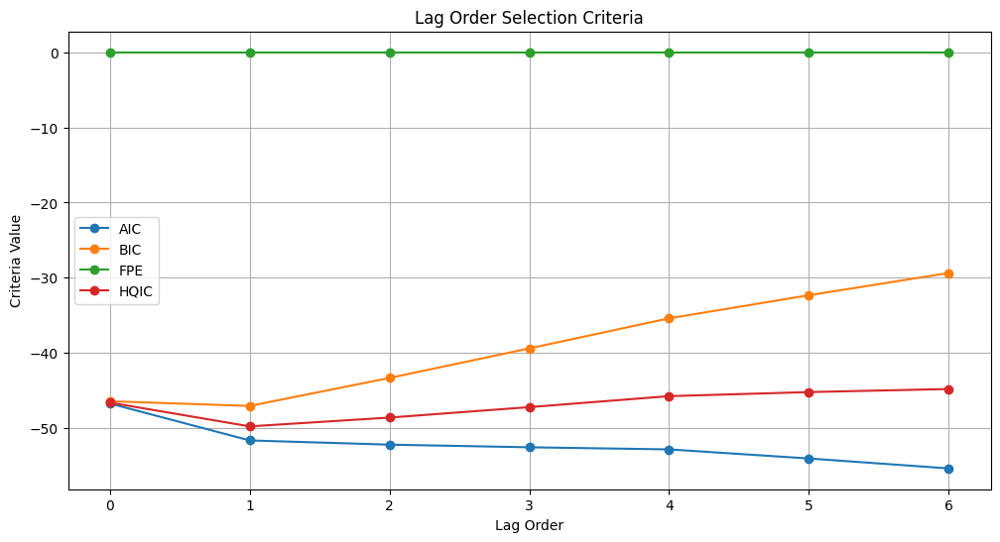

In [55]:
import matplotlib.pyplot as plt

# Extract the lag order selection results
aic_values = [-46.72, -51.63, -52.19, -52.54, -52.82, -54.03, -55.35]
bic_values = [-46.42, -47.04, -43.32, -39.39, -35.39, -32.32, -29.36]
fpe_values = [5.105e-21, 3.850e-23, 2.393e-23, 2.148e-23, 2.687e-23, 2.026e-23, 2.715e-23]
hqic_values = [-46.60, -49.76, -48.59, -47.20, -45.74, -45.20, -44.79]
lags = range(0, 7)  # Lag orders from 0 to 6

# Plot the selection criteria
plt.figure(figsize=(12, 6))
plt.plot(lags, aic_values, marker='o', label='AIC')
plt.plot(lags, bic_values, marker='o', label='BIC')
plt.plot(lags, fpe_values, marker='o', label='FPE')
plt.plot(lags, hqic_values, marker='o', label='HQIC')
plt.xlabel('Lag Order')
plt.ylabel('Criteria Value')
plt.title('Lag Order Selection Criteria')
plt.legend()
plt.grid()
plt.xticks(lags)
plt.show()

<div style="background-color: yellow; padding: 10px;">
    
**The Optimal Lag Order based on the BIC criterion is 1**, *which means that a simpler model with only one lag is preferred. BIC is often favored in econometric modeling because it balances model fit and complexity more conservatively, reducing the risk of overfitting. Given that BIC and HQIC both suggest a lag order of 1, this implies that: Most Important Conclusion: A VAR model with a lag order of 1 is likely sufficient to capture the relationships between the variables in your dataset without introducing unnecessary complexity. This choice balances predictive power and model parsimony, making it a robust option for further analysis and forecasting.*

</div>

# VARX Modelling

Incorporating 'Russia_Ukraine_Date_Flag' and 'Covid_Flag' in the VAR Model.
Incorporate as Exogenous Variables: Since these variables are binary flags indicating specific events rather than continuous time series data, they can be included as exogenous variables in the VAR model. Exogenous variables are external factors that can influence the endogenous variables but are not influenced by them.

In [56]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX

# Extract the stationary data for the endogenous variables
endog_data = df_final.drop(columns=['Russia_Ukraine_Date_Flag', 'Covid_Flag'])

# Extract the exogenous variables (event flags)
exog_data = df_final[['Russia_Ukraine_Date_Flag', 'Covid_Flag']]

# Initialize the VARMAX model with exogenous variables
model = VARMAX(endog_data, exog=exog_data, order=(optimal_lag, 0))  # (p, q) where q is set to 0 for VAR

# Fit the VARMAX model
results = model.fit(disp=False, maxiter=10000, method='powell')

# Print the summary of the VARMAX model
print(results.summary())

                                                                                                                                                                                                                             Statespace Model Results                                                                                                                                                                                                                            
Dep. Variable:     ['Trade_Volume_Pct_Change_Index_Value', 'US_Crude_Oil_Prices_Dollar_Per_Barrel', 'Federal_Rates_Monthly', 'Nominal_Broad_US_Dollar_Index', 'Adjusted_Closing_Price', 'US_Export_to_Russia', 'US_Unemployment_Rate', 'US_Consumer_Sentiment', 'US_Gasoline_Dollars_Per_Barrel', 'Price', 'US_Mean_Monthly_Market_Volatility', 'Average_Hourly_Earning', 'CPI_Value_Inflation', 'producer_price_index_all_commodities']   No. Observations:                  138
Model:                                                              

In [23]:
# !pip install pickle

In [24]:
# ### Exporting the model
# with open('varx_model.pkl', 'wb') as file:
#     pickle.dump(results, file)

In [35]:
# ### Load the Exported Model
# with open('varx_model.pkl', 'rb') as file:
#     varx_model= pickle.load(file)

# use the loaded modle to reload model summary
# print(varx_model.summary())

# Post Modelling Analysis - Residual Analysis

In [30]:
from statsmodels.stats.diagnostic import acorr_ljungbox

# Extract the residuals from the VARX model
residuals = varx_model.resid

# Perform the Ljung-Box test for each residual series
for column in residuals.columns:
    print(f"Ljung-Box Test Results for {column}:")
    ljung_box_results = acorr_ljungbox(residuals[column], lags=[10, 20], return_df=True)
    print(ljung_box_results, "\n")

Ljung-Box Test Results for Trade_Volume_Pct_Change_Index_Value:
      lb_stat  lb_pvalue
10  30.377994   0.000743
20  44.407259   0.001327 

Ljung-Box Test Results for US_Crude_Oil_Prices_Dollar_Per_Barrel:
      lb_stat  lb_pvalue
10   9.329392   0.501154
20  14.421076   0.808521 

Ljung-Box Test Results for Federal_Rates_Monthly:
      lb_stat  lb_pvalue
10  11.542526   0.316839
20  16.113831   0.709538 

Ljung-Box Test Results for Nominal_Broad_US_Dollar_Index:
      lb_stat  lb_pvalue
10  22.982237   0.010812
20  34.639303   0.022112 

Ljung-Box Test Results for Adjusted_Closing_Price:
      lb_stat  lb_pvalue
10  20.148801   0.027876
20  33.013441   0.033626 

Ljung-Box Test Results for US_Export_to_Russia:
      lb_stat  lb_pvalue
10  25.992612   0.003750
20  63.555729   0.000002 

Ljung-Box Test Results for US_Unemployment_Rate:
      lb_stat  lb_pvalue
10  14.477870   0.152289
20  22.183195   0.330653 

Ljung-Box Test Results for US_Consumer_Sentiment:
      lb_stat  lb_pvalue


In [25]:
from statsmodels.stats.stattools import jarque_bera

# Apply the Jarque-Bera test to each residual series
for column in residuals.columns:
    jb_stat, jb_p_value, _, _ = jarque_bera(residuals[column])
    print(f"Jarque-Bera Test for {column}:")
    print(f"  JB Statistic: {jb_stat}")
    print(f"  p-value: {jb_p_value}\n")

Jarque-Bera Test for Trade_Volume_Pct_Change_Index_Value:
  JB Statistic: 2.4019603426484477
  p-value: 0.3008991346194382

Jarque-Bera Test for US_Crude_Oil_Prices_Dollar_Per_Barrel:
  JB Statistic: 2.1368451065354415
  p-value: 0.343550022068736

Jarque-Bera Test for Federal_Rates_Monthly:
  JB Statistic: 5066.667454119317
  p-value: 0.0

Jarque-Bera Test for Nominal_Broad_US_Dollar_Index:
  JB Statistic: 0.08894920065892203
  p-value: 0.9564998945672762

Jarque-Bera Test for Adjusted_Closing_Price:
  JB Statistic: 8.50734924863083
  p-value: 0.014211914394388687

Jarque-Bera Test for US_Export_to_Russia:
  JB Statistic: 7.024498076684869
  p-value: 0.02982975068527403

Jarque-Bera Test for US_Unemployment_Rate:
  JB Statistic: 478.7845749062462
  p-value: 1.0795693571720718e-104

Jarque-Bera Test for US_Consumer_Sentiment:
  JB Statistic: 1.4457640861354615
  p-value: 0.4853514345783777

Jarque-Bera Test for US_Gasoline_Dollars_Per_Barrel:
  JB Statistic: 13.719278540927085
  p-valu

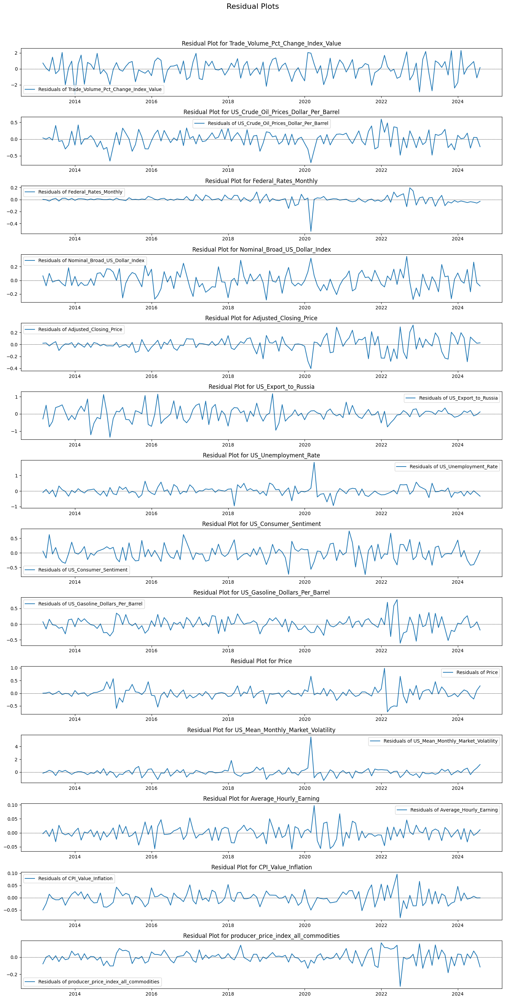

In [28]:
import matplotlib.pyplot as plt

# Plot the residuals for each endogenous variable
fig, axes = plt.subplots(nrows=len(residuals.columns), ncols=1, figsize=(15, 30))
fig.suptitle('Residual Plots', fontsize=16)

for i, column in enumerate(residuals.columns):
    axes[i].plot(residuals.index, residuals[column], label=f'Residuals of {column}')
    axes[i].axhline(0, color='black', linestyle='--', linewidth=0.5)
    axes[i].legend()
    axes[i].set_title(f'Residual Plot for {column}')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

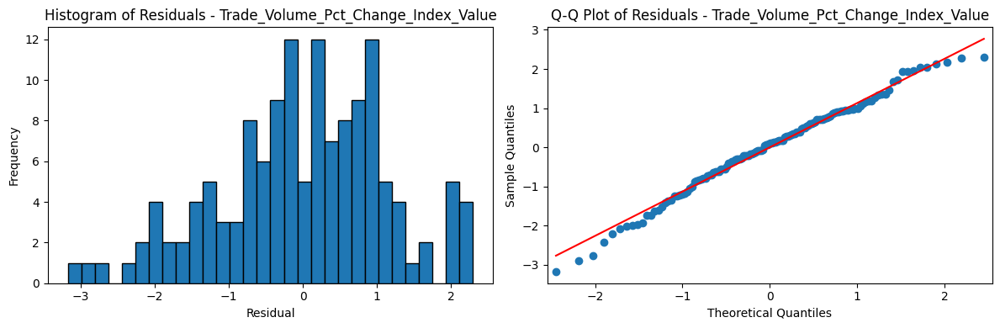

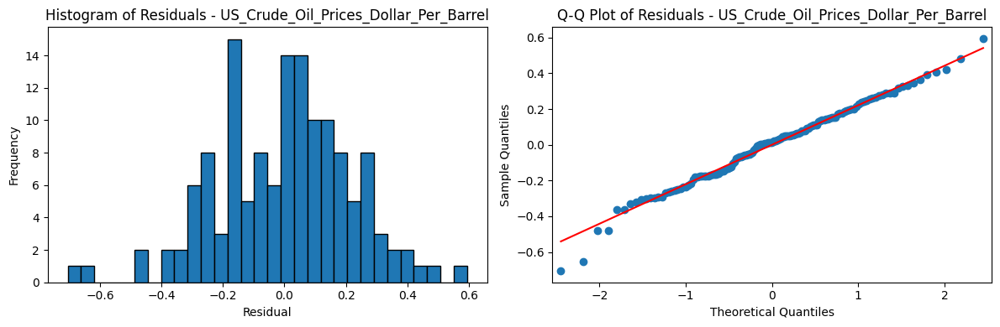

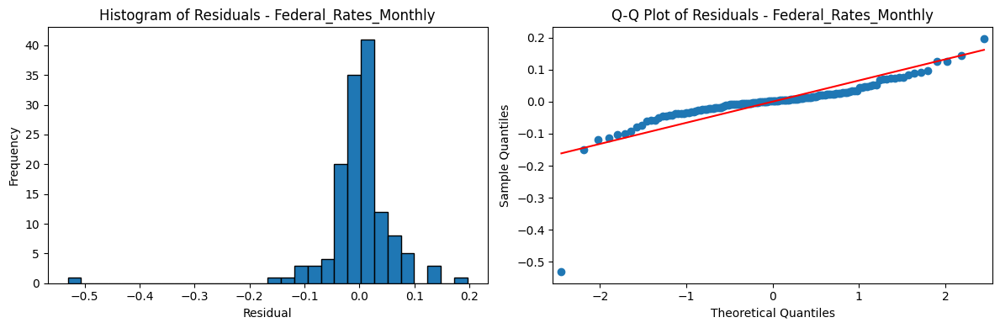

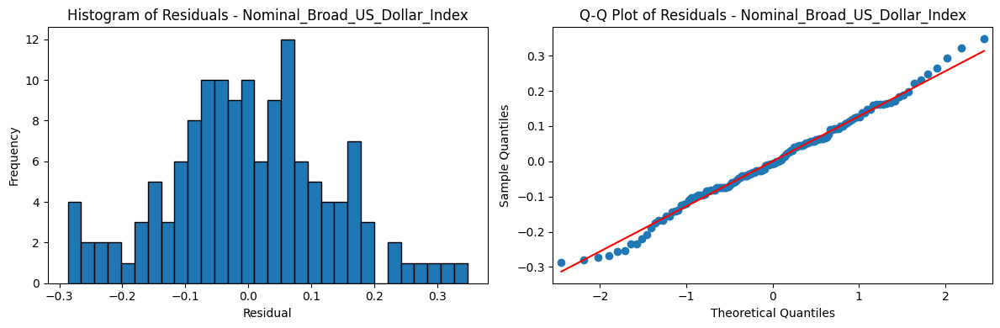

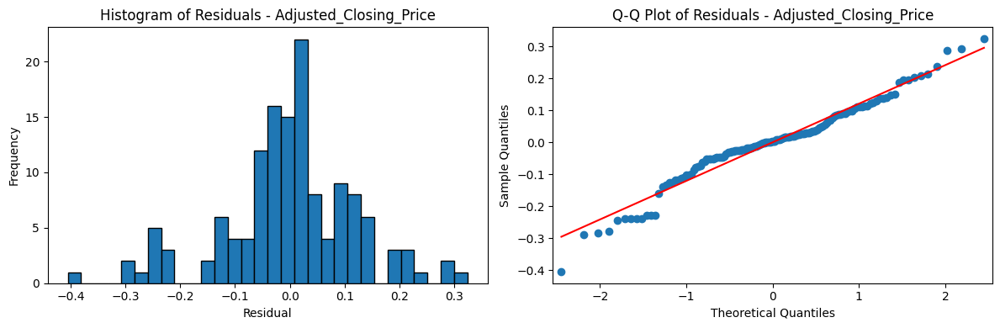

...

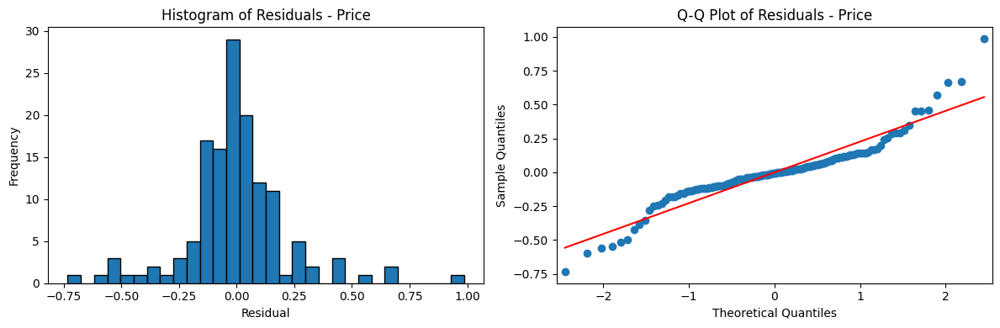

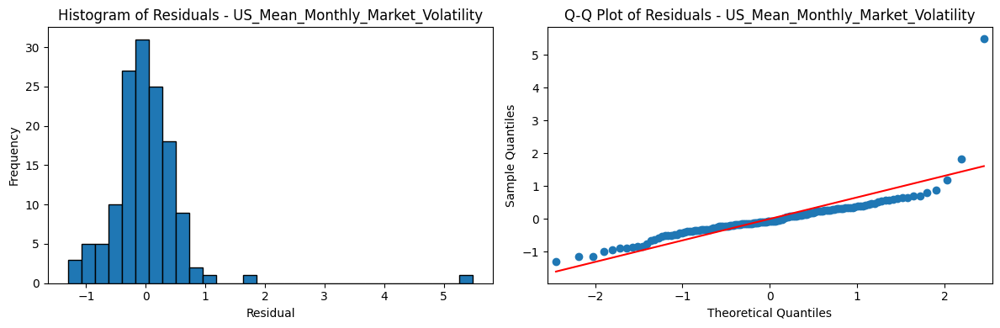

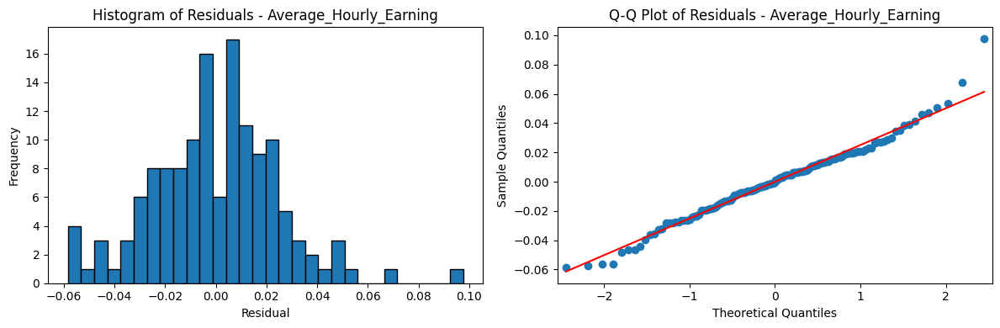

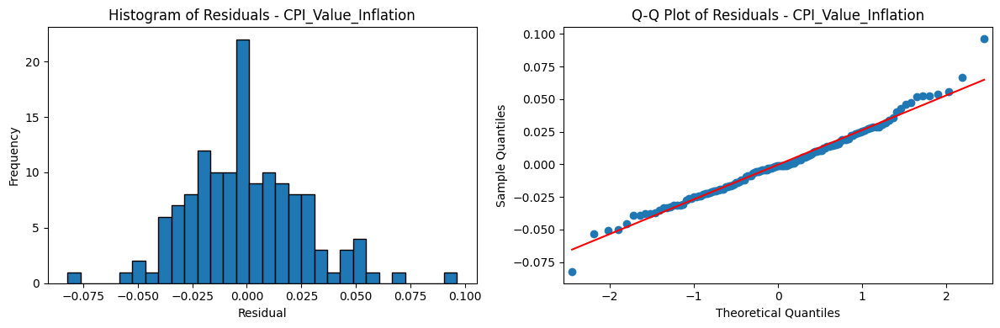

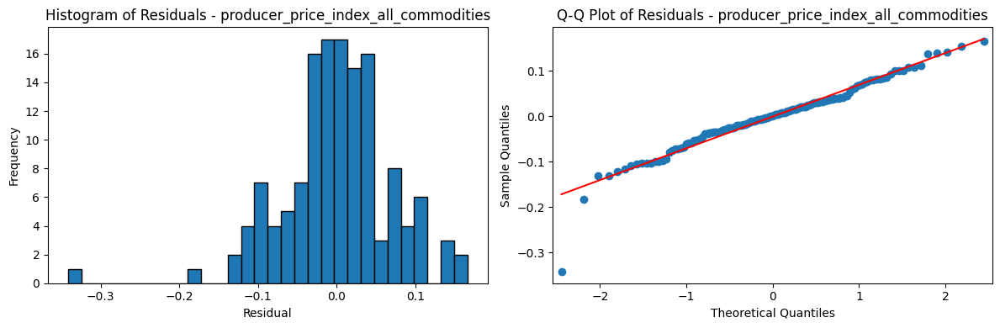

In [29]:
import statsmodels.api as sm

# Generate a histogram and Q-Q plot for each residual series
for column in residuals.columns:
    plt.figure(figsize=(12, 4))
    
    # Histogram
    plt.subplot(1, 2, 1)
    plt.hist(residuals[column], bins=30, edgecolor='black')
    plt.title(f'Histogram of Residuals - {column}')
    plt.xlabel('Residual')
    plt.ylabel('Frequency')

    # Q-Q Plot
    plt.subplot(1, 2, 2)
    sm.qqplot(residuals[column], line='s', ax=plt.gca())
    plt.title(f'Q-Q Plot of Residuals - {column}')
    
    plt.tight_layout()
    plt.show()


# Post Modelling Analysis - Impulse Response Analysis

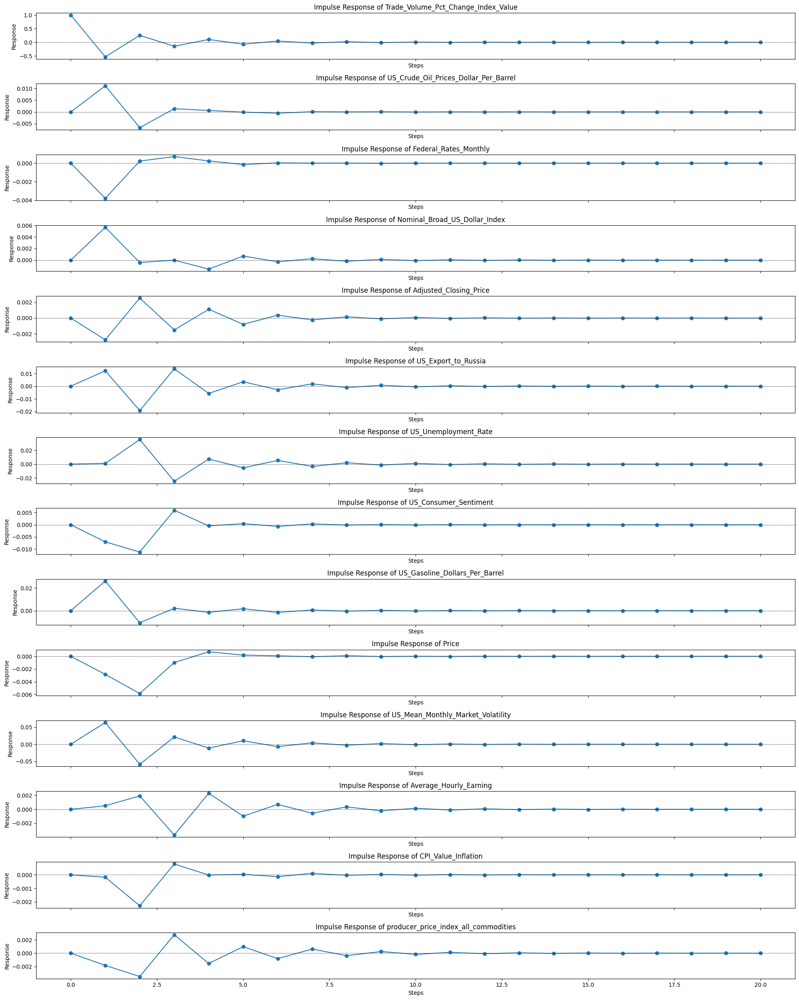

In [42]:
import matplotlib.pyplot as plt

# Step 1: Convert the impulse responses to a DataFrame if needed
if not isinstance(irf, pd.DataFrame):
    irf = pd.DataFrame(irf, columns=endog_data.columns)

# Step 2: Plot each variable's impulse response
fig, axes = plt.subplots(nrows=irf.shape[1], figsize=(20, 25), sharex=True)
for i, column in enumerate(irf.columns):
    axes[i].plot(irf[column], marker='o')
    axes[i].set_title(f"Impulse Response of {column}")
    axes[i].axhline(0, color='black', lw=0.5, linestyle='--')
    axes[i].set_xlabel("Steps")
    axes[i].set_ylabel("Response")

plt.tight_layout()
# Save the plot as an image
plt.tight_layout()
plt.savefig("impulse_response_analysis.png", dpi=300)  # Adjust the filename and DPI as needed
plt.show()


# Post Modelling Analysis - Variance Decomposition Analysis

Variance Decomposition Results (10 steps):
   Trade_Volume_Pct_Change_Index_Value US_Crude_Oil_Prices_Dollar_Per_Barrel  \
1                                  NaN                                   NaN   
2                             0.997825                              0.000052   
3                             0.991724                              0.000136   
4                              0.99115                              0.000124   
5                              0.99088                              0.000124   
6                             0.991014                              0.000122   
7                             0.990921                              0.000124   
8                             0.990972                              0.000123   
9                             0.990963                              0.000123   
10                            0.990994                              0.000122   

   Federal_Rates_Monthly Nominal_Broad_US_Dollar_Index Adjusted_Closing_Pric

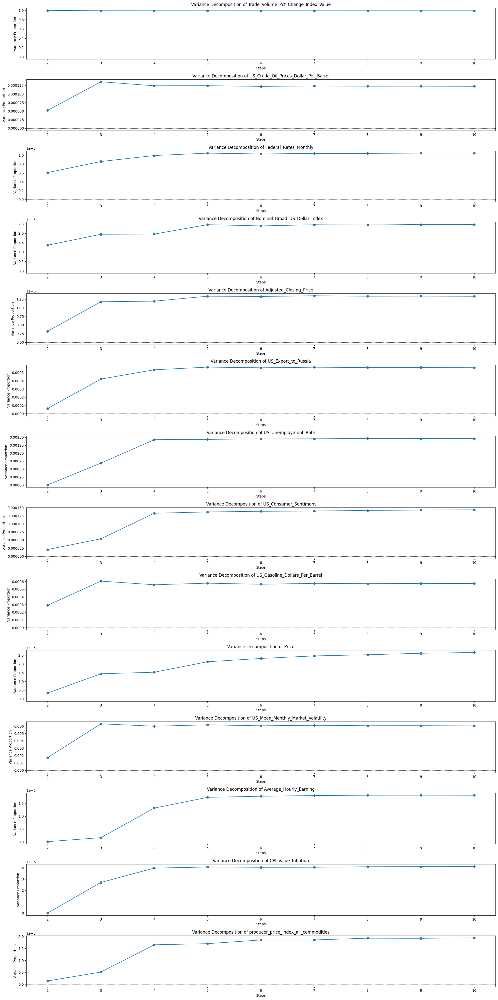

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def manual_variance_decomposition(varx_model, steps=10):
    # Extract the impulse responses for the specified number of steps
    irf = varx_model.impulse_responses(steps=steps)
    
    # Convert impulse responses to DataFrame for easier handling
    if not isinstance(irf, pd.DataFrame):
        irf = pd.DataFrame(irf, columns=varx_model.model.endog_names)

    # Initialize a DataFrame to store variance decomposition results
    variance_df = pd.DataFrame(index=range(1, steps + 1), columns=irf.columns)
    
    # Perform variance decomposition for each step
    for step in range(steps):
        # Calculate the variance explained by shocks in each variable
        for var in irf.columns:
            variance_df.loc[step + 1, var] = np.var(irf[var].iloc[:step + 1])
    
    # Normalize each row to represent proportions
    variance_df = variance_df.div(variance_df.sum(axis=1), axis=0)
    
    return variance_df

# Perform the variance decomposition analysis
steps = 10  # Adjust the steps as needed
variance_df = manual_variance_decomposition(varx_model, steps=steps)

# Display the variance decomposition results
print("Variance Decomposition Results (10 steps):")
print(variance_df)

# Plot the variance decomposition for each variable
fig, axes = plt.subplots(nrows=len(variance_df.columns), figsize=(20, 40))
for i, column in enumerate(variance_df.columns):
    axes[i].plot(variance_df.index, variance_df[column], marker='o')
    axes[i].set_title(f"Variance Decomposition of {column}")
    axes[i].set_xlabel("Steps")
    axes[i].set_ylabel("Variance Proportion")
    axes[i].axhline(0, color='black', lw=0.5, linestyle='--')

plt.tight_layout()
plt.savefig("variance_decomposition_analysis.png", dpi=300)  # Save the plot as an image
plt.show()


# Post Modelling Analysis - Granger Causality Test

In [50]:
from statsmodels.tsa.stattools import grangercausalitytests

# Function to perform Granger Causality Test for each pair of variables
def perform_granger_causality_tests(endog_data, max_lag=10):
    causality_results = {}
    
    # Loop through each pair of variables
    for col1 in endog_data.columns:
        for col2 in endog_data.columns:
            if col1 != col2:  # Test each unique pair
                print(f"\nTesting Granger Causality: {col1} causing {col2}")
                # Perform the Granger causality test
                test_result = grangercausalitytests(endog_data[[col2, col1]], max_lag, verbose=True)
                causality_results[(col1, col2)] = test_result
                
    return causality_results

# Perform the Granger Causality Tests on the endogenous data
max_lag = 10  # You can adjust the maximum number of lags as needed
granger_causality_results = perform_granger_causality_tests(endog_data, max_lag=max_lag)



Testing Granger Causality: Trade_Volume_Pct_Change_Index_Value causing US_Crude_Oil_Prices_Dollar_Per_Barrel

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8406  , p=0.3609  , df_denom=134, df_num=1
ssr based chi2 test:   chi2=0.8594  , p=0.3539  , df=1
likelihood ratio test: chi2=0.8567  , p=0.3547  , df=1
parameter F test:         F=0.8406  , p=0.3609  , df_denom=134, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4400  , p=0.6450  , df_denom=131, df_num=2
ssr based chi2 test:   chi2=0.9137  , p=0.6333  , df=2
likelihood ratio test: chi2=0.9106  , p=0.6342  , df=2
parameter F test:         F=0.4400  , p=0.6450  , df_denom=131, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.2130  , p=0.8873  , df_denom=128, df_num=3
ssr based chi2 test:   chi2=0.6739  , p=0.8793  , df=3
likelihood ratio test: chi2=0.6722  , p=0.8797  , df=3
parameter F test:         F=0.2130  , p=0.8873  , df_deno

**Including exogenous variables in Granger causality tests is not straightforward in the traditional sense, as the standard grangercausalitytests function from statsmodels only works for pairs of endogenous variables. However, you can manually test the causal impact of exogenous variables on endogenous variables using regression-based methods or an adapted approach.**:

Step-by-Step Approach for Testing Exogenous Variables' Impact:
- Create an Augmented Model: Include your exogenous variables in a regression model along with the lags of the endogenous variables.
- Use F-tests or Likelihood Ratio Tests: To determine if the inclusion of exogenous variables significantly improves the model fit.

In [51]:
import statsmodels.api as sm
import numpy as np
import pandas as pd
from statsmodels.tsa.tsatools import lagmat

# Function to test the impact of exogenous variables on an endogenous variable
def test_exogenous_impact(endog_var, exog_vars, max_lag=10):
    results = {}
    
    # Create lagged versions of the endogenous variable
    lags = lagmat(endog_var.values, max_lag, trim='both')
    
    # Include lagged endogenous variables and exogenous variables as predictors
    for exog_var in exog_vars.columns:
        print(f"\nTesting impact of exogenous variable: {exog_var} on {endog_var.name}")
        
        # Build a regression model with lags and the exogenous variable
        predictors = np.column_stack((lags, exog_vars[exog_var].iloc[max_lag:].values))
        predictors = sm.add_constant(predictors)  # Add constant term
        
        # Fit the regression model
        model = sm.OLS(endog_var.iloc[max_lag:], predictors).fit()
        
        # Perform an F-test to assess the impact of the exogenous variable
        exog_index = max_lag + 1  # Index of the exogenous variable in the predictors
        f_test = model.f_test(np.eye(model.params.shape[0])[exog_index:exog_index+1])
        results[exog_var] = f_test
        
        # Print the F-test results
        print(f_test)
    
    return results

# Perform the analysis for each endogenous variable
for column in endog_data.columns:
    print(f"\nAnalyzing {column}:")
    test_exogenous_impact(endog_data[column], exog_data, max_lag=10)



Analyzing Trade_Volume_Pct_Change_Index_Value:

Testing impact of exogenous variable: Russia_Ukraine_Date_Flag on Trade_Volume_Pct_Change_Index_Value
<F test: F=0.3191095257146603, p=0.5732341131820083, df_denom=116, df_num=1>

Testing impact of exogenous variable: Covid_Flag on Trade_Volume_Pct_Change_Index_Value
<F test: F=0.19831128734145512, p=0.6569173309125667, df_denom=116, df_num=1>

Analyzing US_Crude_Oil_Prices_Dollar_Per_Barrel:

Testing impact of exogenous variable: Russia_Ukraine_Date_Flag on US_Crude_Oil_Prices_Dollar_Per_Barrel
<F test: F=0.02494376214797654, p=0.8747818778742523, df_denom=116, df_num=1>

Testing impact of exogenous variable: Covid_Flag on US_Crude_Oil_Prices_Dollar_Per_Barrel
<F test: F=0.3434474050616301, p=0.5589846135751808, df_denom=116, df_num=1>

Analyzing Federal_Rates_Monthly:

Testing impact of exogenous variable: Russia_Ukraine_Date_Flag on Federal_Rates_Monthly
<F test: F=6.070252549606903, p=0.015214847489601386, df_denom=116, df_num=1>

Te

# Model Diagnostic Checks

### Ljung-Box Test for Autocorrelation

In [52]:
from statsmodels.stats.diagnostic import acorr_ljungbox

print("Ljung-Box Test Results:")
for column in endog_data.columns:
    lb_test = acorr_ljungbox(residuals[column], lags=[10, 20], return_df=True)
    print(f"\n{column}:")
    print(lb_test)


Ljung-Box Test Results:

Trade_Volume_Pct_Change_Index_Value:
      lb_stat  lb_pvalue
10  30.377994   0.000743
20  44.407259   0.001327

US_Crude_Oil_Prices_Dollar_Per_Barrel:
      lb_stat  lb_pvalue
10   9.329392   0.501154
20  14.421076   0.808521

Federal_Rates_Monthly:
      lb_stat  lb_pvalue
10  11.542526   0.316839
20  16.113831   0.709538

Nominal_Broad_US_Dollar_Index:
      lb_stat  lb_pvalue
10  22.982237   0.010812
20  34.639303   0.022112

Adjusted_Closing_Price:
      lb_stat  lb_pvalue
10  20.148801   0.027876
20  33.013441   0.033626

US_Export_to_Russia:
      lb_stat  lb_pvalue
10  25.992612   0.003750
20  63.555729   0.000002

US_Unemployment_Rate:
      lb_stat  lb_pvalue
10  14.477870   0.152289
20  22.183195   0.330653

US_Consumer_Sentiment:
      lb_stat  lb_pvalue
10  17.600686   0.062085
20  31.157893   0.053140

US_Gasoline_Dollars_Per_Barrel:
      lb_stat  lb_pvalue
10  28.350769   0.001586
20  55.992854   0.000029

Price:
      lb_stat  lb_pvalue
10  12.

### ACF and PACF Plots

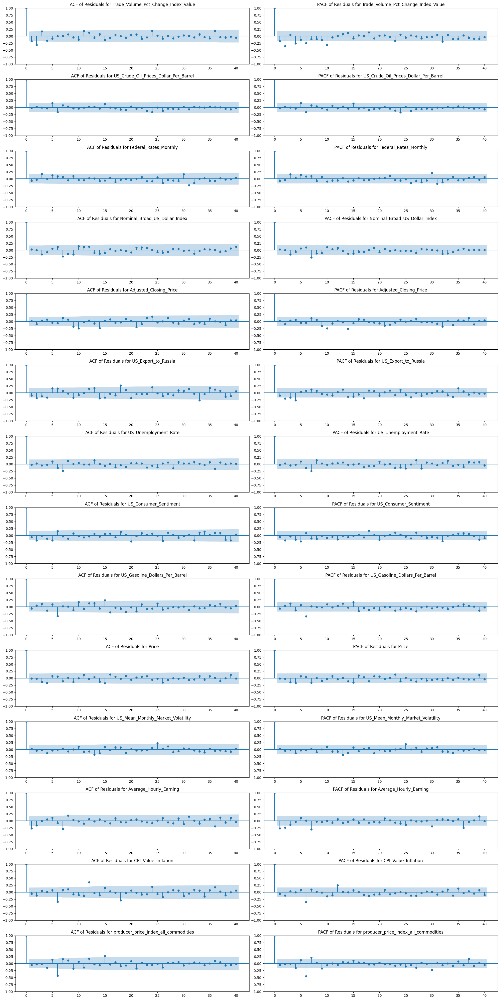

In [60]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Plot ACF and PACF side by side for each variable
fig, axes = plt.subplots(nrows=len(endog_data.columns), ncols=2, figsize=(20, 40))

for i, column in enumerate(endog_data.columns):
    # Plot ACF on the left side
    sm.graphics.tsa.plot_acf(residuals[column].dropna(), lags=40, ax=axes[i, 0], alpha=0.05)
    axes[i, 0].set_title(f"ACF of Residuals for {column}")

    # Plot PACF on the right side
    sm.graphics.tsa.plot_pacf(residuals[column].dropna(), lags=40, ax=axes[i, 1], alpha=0.05)
    axes[i, 1].set_title(f"PACF of Residuals for {column}")

plt.tight_layout()
plt.show()

### Histogram and Density Plot for Normality Check

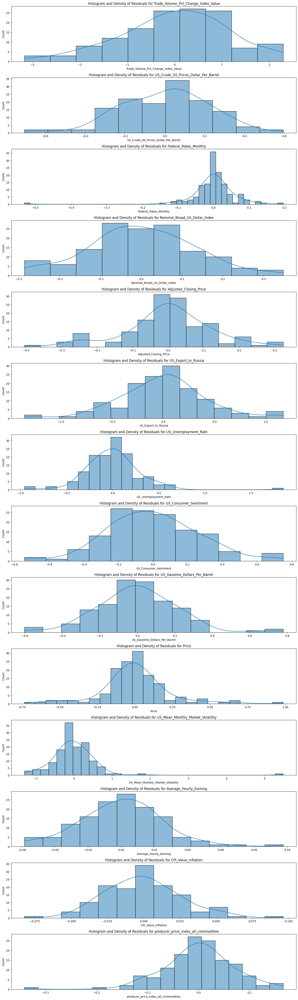

In [57]:
# Plot histogram and density of residuals
fig, axes = plt.subplots(nrows=len(endog_data.columns), figsize=(15, 50))
for i, column in enumerate(endog_data.columns):
    sns.histplot(residuals[column].dropna(), kde=True, ax=axes[i])
    axes[i].set_title(f"Histogram and Density of Residuals for {column}")

plt.tight_layout()
plt.show()

### ARCH Test for Heteroskedasticity

In [58]:
from statsmodels.stats.diagnostic import het_arch

print("\nARCH Test Results (for Heteroskedasticity):")
for column in endog_data.columns:
    arch_test = het_arch(residuals[column].dropna())
    print(f"\n{column}:")
    print(f"LM Statistic: {arch_test[0]}, p-value: {arch_test[1]}")


ARCH Test Results (for Heteroskedasticity):

Trade_Volume_Pct_Change_Index_Value:
LM Statistic: 9.631154508015427, p-value: 0.4734269416346829

US_Crude_Oil_Prices_Dollar_Per_Barrel:
LM Statistic: 5.6551166782482625, p-value: 0.8433589921345714

Federal_Rates_Monthly:
LM Statistic: 0.7057023691202602, p-value: 0.9999659887479097

Nominal_Broad_US_Dollar_Index:
LM Statistic: 9.188289665491553, p-value: 0.5143324251506709

Adjusted_Closing_Price:
LM Statistic: 20.127886950528165, p-value: 0.028066034277842482

US_Export_to_Russia:
LM Statistic: 14.61482025727912, p-value: 0.14674852264652533

US_Unemployment_Rate:
LM Statistic: 6.580068320238141, p-value: 0.764404742214905

US_Consumer_Sentiment:
LM Statistic: 7.9190443101324774, p-value: 0.6367444202272028

US_Gasoline_Dollars_Per_Barrel:
LM Statistic: 39.740541178325344, p-value: 1.8823092577859657e-05

Price:
LM Statistic: 27.345256015131014, p-value: 0.002295948963900039

US_Mean_Monthly_Market_Volatility:
LM Statistic: 0.4926223143

### Variance Inflation Factor (VIF) for Multicollinearity

In [59]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd
import statsmodels.api as sm

print("\nVariance Inflation Factor (VIF):")
vif_data = endog_data.copy()
vif_data = sm.add_constant(vif_data)  # Add constant term for VIF calculation
vif = pd.DataFrame({
    "Variable": vif_data.columns,
    "VIF": [variance_inflation_factor(vif_data.values, i) for i in range(vif_data.shape[1])]
})
print(vif)


Variance Inflation Factor (VIF):
                                 Variable       VIF
0                                   const  1.232401
1     Trade_Volume_Pct_Change_Index_Value  1.087875
2   US_Crude_Oil_Prices_Dollar_Per_Barrel  3.101137
3                   Federal_Rates_Monthly  1.382016
4           Nominal_Broad_US_Dollar_Index  1.458683
5                  Adjusted_Closing_Price  1.546184
6                     US_Export_to_Russia  1.072789
7                    US_Unemployment_Rate  2.385836
8                   US_Consumer_Sentiment  1.311815
9          US_Gasoline_Dollars_Per_Barrel  2.782467
10                                  Price  1.334567
11      US_Mean_Monthly_Market_Volatility  2.162934
12                 Average_Hourly_Earning  1.758266
13                    CPI_Value_Inflation  2.399105
14   producer_price_index_all_commodities  2.484177


# Historical Decomposition Analysis

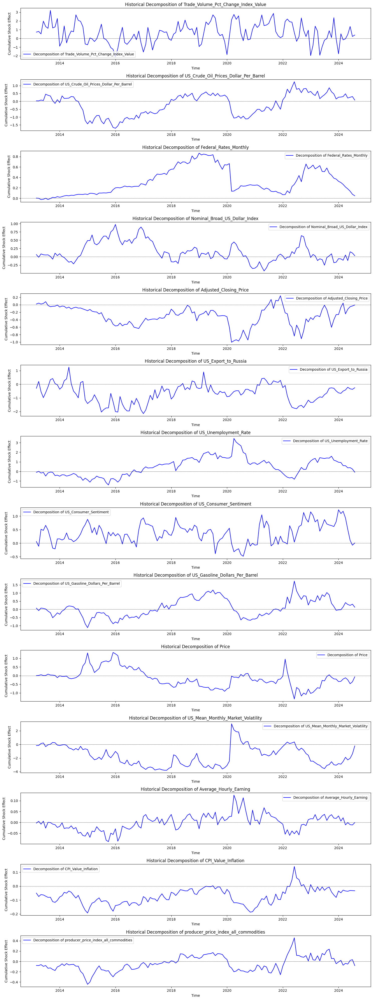

In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'varx_model' is your fitted VARX model
# Step 1: Define a function for historical decomposition
def historical_decomposition(varx_model):
    # Calculate the model's predicted values
    fitted_values = varx_model.fittedvalues

    # Calculate residuals (actual - predicted)
    residuals = varx_model.resid

    # Decompose each variable into components explained by shocks
    decomposition = {}
    for column in residuals.columns:
        # Compute cumulative sum of residuals for each variable
        decomposition[column] = residuals[column].cumsum()

    # Convert to DataFrame
    decomposition_df = pd.DataFrame(decomposition)

    return decomposition_df

# Step 2: Perform historical decomposition
decomposition_df = historical_decomposition(varx_model)

# Step 3: Plot the historical decomposition
fig, axes = plt.subplots(nrows=len(decomposition_df.columns), figsize=(15, 40))
for i, column in enumerate(decomposition_df.columns):
    axes[i].plot(decomposition_df.index, decomposition_df[column], label=f"Decomposition of {column}", color="blue")
    axes[i].axhline(0, color='black', lw=0.5, linestyle='--')
    axes[i].set_title(f"Historical Decomposition of {column}")
    axes[i].set_xlabel("Time")
    axes[i].set_ylabel("Cumulative Shock Effect")
    axes[i].legend()

plt.tight_layout()
plt.show()


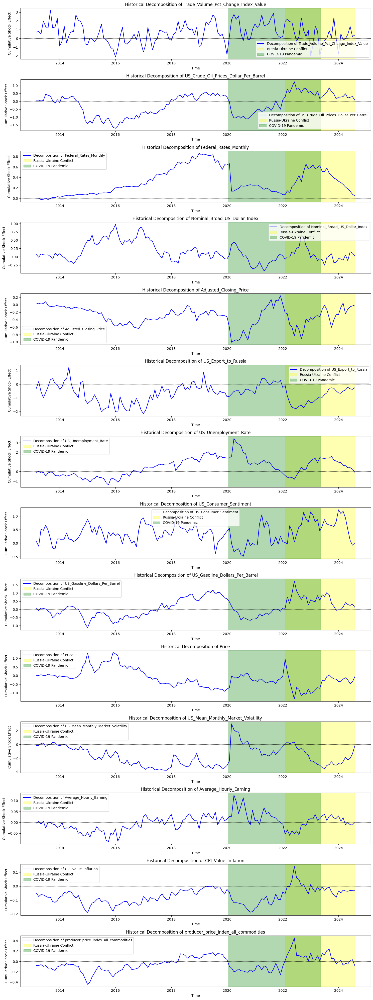

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'varx_model' is your fitted VARX model and 'exog_data' contains the exogenous variables
# Step 1: Define a function for historical decomposition with exogenous shocks
def historical_decomposition_with_shocks(varx_model, exog_data):
    # Calculate the model's predicted values
    fitted_values = varx_model.fittedvalues

    # Calculate residuals (actual - predicted)
    residuals = varx_model.resid

    # Decompose each variable into components explained by shocks
    decomposition = {}
    for column in residuals.columns:
        # Compute cumulative sum of residuals for each variable
        decomposition[column] = residuals[column].cumsum()

    # Convert to DataFrame
    decomposition_df = pd.DataFrame(decomposition)

    return decomposition_df

# Step 2: Perform historical decomposition
decomposition_df = historical_decomposition_with_shocks(varx_model, exog_data)

# Step 3: Define the date ranges for the exogenous shocks
shock_ranges = {
    "Russia-Ukraine Conflict": ("2022-02-01", decomposition_df.index[-1]),  # Start date is February 1, 2022
    "COVID-19 Pandemic": ("2020-01-20", "2023-05-11")  # Date range from January 20, 2020, to May 11, 2023
}

# Step 4: Plot the historical decomposition with highlighted shock periods
fig, axes = plt.subplots(nrows=len(decomposition_df.columns), figsize=(15, 40))
for i, column in enumerate(decomposition_df.columns):
    axes[i].plot(decomposition_df.index, decomposition_df[column], label=f"Decomposition of {column}", color="blue")
    axes[i].axhline(0, color='black', lw=0.5, linestyle='--')
    axes[i].set_title(f"Historical Decomposition of {column}")
    axes[i].set_xlabel("Time")
    axes[i].set_ylabel("Cumulative Shock Effect")

    # Highlight the shock periods on the plot
    axes[i].axvspan("2022-02-01", decomposition_df.index[-1], color='yellow', alpha=0.3, label="Russia-Ukraine Conflict")
    axes[i].axvspan("2020-01-20", "2023-05-11", color='green', alpha=0.3, label="COVID-19 Pandemic")

    # Only add the legend once per plot
    handles, labels = axes[i].get_legend_handles_labels()
    unique_labels = dict(zip(labels, handles))
    axes[i].legend(unique_labels.values(), unique_labels.keys())

plt.tight_layout()
plt.show()


# Counterfactual Analysis

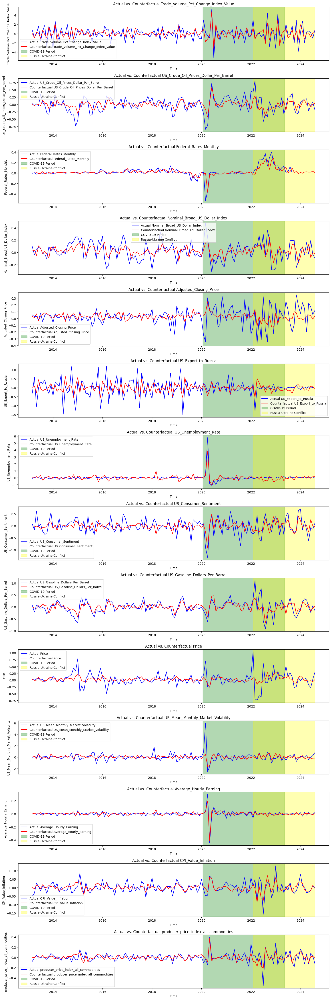

In [69]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.varmax import VARMAX

# Step 1: Create a copy of the exogenous variables
counterfactual_exog = exog_data.copy()

# Step 2: Modify the exogenous variables for counterfactual analysis
# Set the Russia-Ukraine Conflict Flag and COVID-19 Flag to 0 (as if these events never occurred)
counterfactual_exog['Russia_Ukraine_Date_Flag'] = 0
counterfactual_exog['Covid_Flag'] = 0

# Step 3: Re-fit the model using the modified exogenous variables
counterfactual_model = VARMAX(endog_data, exog=counterfactual_exog, order=(optimal_lag, 0)).fit(disp=False, maxiter=10000, method='powell')

# Step 4: Get the counterfactual predictions
counterfactual_predictions = counterfactual_model.fittedvalues

# Step 5: Define the date ranges for the exogenous events
covid_start = pd.Timestamp('2020-01-20')
covid_end = pd.Timestamp('2023-05-11')
russia_ukraine_start = pd.Timestamp('2022-02-01')

# Step 6: Plot the actual vs. counterfactual predictions with shaded regions
fig, axes = plt.subplots(nrows=len(endog_data.columns), figsize=(15, 45))
for i, column in enumerate(endog_data.columns):
    axes[i].plot(endog_data.index, endog_data[column], label=f"Actual {column}", color="blue")
    axes[i].plot(counterfactual_predictions.index, counterfactual_predictions[column], label=f"Counterfactual {column}", color="red")

    # Add shaded regions for the exogenous events
    axes[i].axvspan(covid_start, covid_end, color='green', alpha=0.3, label="COVID-19 Period")
    axes[i].axvspan(russia_ukraine_start, endog_data.index[-1], color='yellow', alpha=0.3, label="Russia-Ukraine Conflict")

    axes[i].set_title(f"Actual vs. Counterfactual {column}")
    axes[i].set_xlabel("Time")
    axes[i].set_ylabel(column)
    axes[i].legend()

plt.tight_layout()
plt.show()


# Sensitivity Analysis

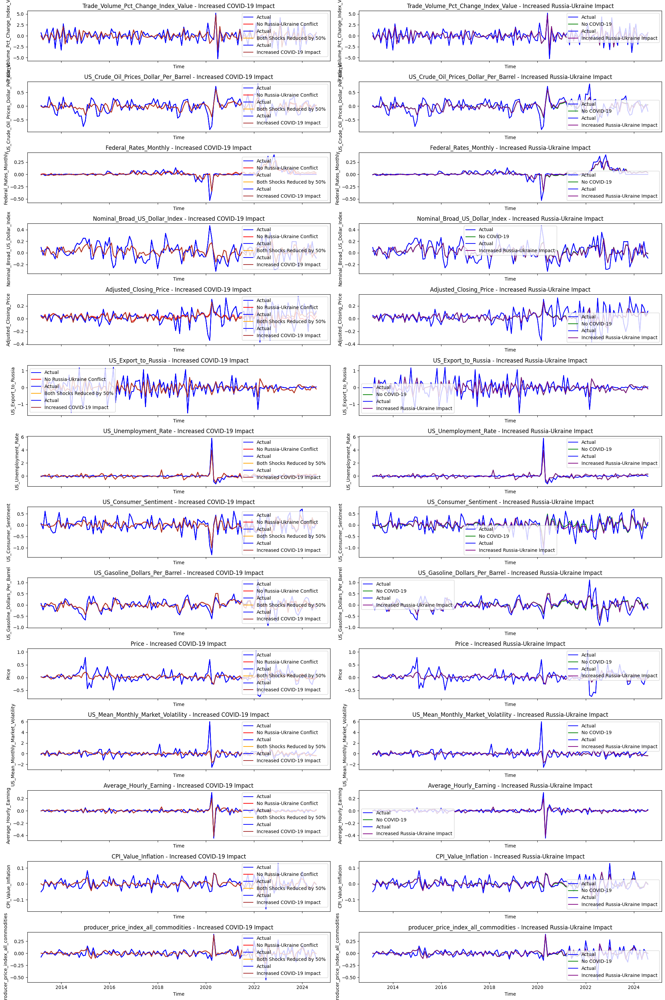

In [73]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.varmax import VARMAX

# Function to perform sensitivity analysis
def sensitivity_analysis(varx_model, exog_data, scenarios):
    # Dictionary to store results for each scenario
    scenario_results = {}

    for scenario_name, modified_exog in scenarios.items():
        # Re-fit the VARX model with modified exogenous variables
        modified_model = VARMAX(endog_data, exog=modified_exog, order=(optimal_lag, 0)).fit(disp=False, maxiter=10000, method='powell')
        # Get the predictions
        scenario_results[scenario_name] = modified_model.fittedvalues

    return scenario_results

# Step 1: Define different scenarios by modifying the exogenous variables
scenarios = {
    "No Russia-Ukraine Conflict": exog_data.copy().assign(Russia_Ukraine_Date_Flag=0),
    "No COVID-19": exog_data.copy().assign(Covid_Flag=0),
    "Both Shocks Reduced by 50%": exog_data.copy().assign(
        Russia_Ukraine_Date_Flag=exog_data['Russia_Ukraine_Date_Flag'] * 0.5,
        Covid_Flag=exog_data['Covid_Flag'] * 0.5
    ),
    "Increased Russia-Ukraine Impact": exog_data.copy().assign(Russia_Ukraine_Date_Flag=exog_data['Russia_Ukraine_Date_Flag'] * 1.5),
    "Increased COVID-19 Impact": exog_data.copy().assign(Covid_Flag=exog_data['Covid_Flag'] * 1.5)
}

# Step 2: Perform sensitivity analysis
sensitivity_results = sensitivity_analysis(varx_model, exog_data, scenarios)

# Step 3: Plot the results for each scenario
fig, axes = plt.subplots(nrows=len(endog_data.columns), ncols=2, figsize=(20, 70), sharex=True)
axes = axes.flatten()  # Flatten axes array for easier iteration
colors = ["red", "green", "orange", "purple", "brown"]  # Different colors for scenarios

for i, column in enumerate(endog_data.columns):
    scenario_index = 0
    for scenario_name, predictions in sensitivity_results.items():
        # Plot in sets of two scenarios per row
        ax = axes[i * 2 + scenario_index % 2]
        ax.plot(endog_data.index, endog_data[column], label="Actual", color="blue")
        ax.plot(predictions.index, predictions[column], label=scenario_name, color=colors[scenario_index])
        ax.set_title(f"{column} - {scenario_name}")
        ax.set_xlabel("Time")
        ax.set_ylabel(column)
        ax.legend()
        scenario_index += 1

plt.tight_layout()
plt.show()

Sensitivity Analysis for the VARX Model
Sensitivity Analysis aims to understand how the model's predictions or dynamics change in response to variations in the model's parameters or input variables, including exogenous variables. Here's a structured way to conduct Sensitivity Analysis for a VARX model:

Step-by-Step Approach for Sensitivity Analysis
Modify Exogenous Variables:

Simulate different scenarios by altering the values of exogenous variables (e.g., increasing or decreasing the magnitude of the Russia-Ukraine conflict flag and COVID-19 flag).
Re-fit the Model:

For each modified scenario, fit the VARX model and generate predictions.
Analyze and Compare Predictions:

Compare the model's outcomes across different scenarios to understand how sensitive the economic variables are to changes in the exogenous factors.



Explanation of the Code
sensitivity_analysis Function:

Takes the original VARX model, exogenous data, and a dictionary of scenarios as input.
For each scenario, the function modifies the exogenous variables and re-fits the VARX model.
Stores the predictions of each scenario for comparison.
Defining Scenarios:

We define several hypothetical situations:
"No Russia-Ukraine Conflict": Sets the Russia_Ukraine_Date_Flag to 0.
"No COVID-19": Sets the Covid_Flag to 0.
"Both Shocks Reduced by 50%": Reduces both exogenous variables by 50%.
"Increased Russia-Ukraine Impact": Increases the Russia-Ukraine flag by 50%.
"Increased COVID-19 Impact": Increases the COVID-19 flag by 50%.
Plotting Results:

For each economic variable, we generate a series of plots showing the actual data and predictions for each scenario.
This helps visually assess how sensitive the model is to changes in the exogenous factors.
Purpose and Relevance of Sensitivity Analysis
Understanding Model Robustness:

Sensitivity Analysis helps evaluate how robust the VARX model is to variations in the exogenous variables.
It shows if small changes in the input lead to large deviations in predictions, indicating model instability.
Economic Insights:

By simulating scenarios like "No COVID-19" or "Increased Russia-Ukraine Impact," policymakers can understand the relative importance and impact of these shocks on economic indicators.
This analysis can inform economic policies, such as fiscal or monetary responses to similar future shocks.
Interpreting Results:

If predictions remain stable across scenarios, the model is considered robust.
If certain variables are highly sensitive to exogenous changes, it indicates that these variables are heavily influenced by external shocks.


# Scenario Analysis and Stress Testing 

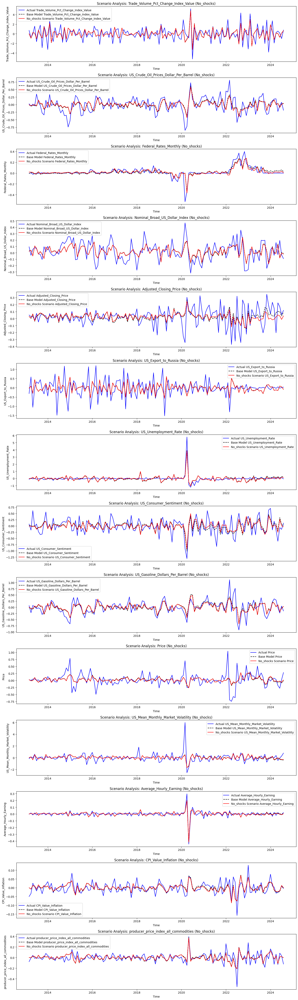

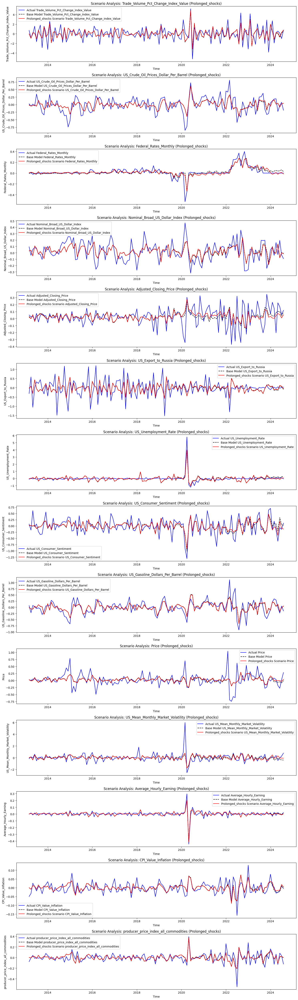

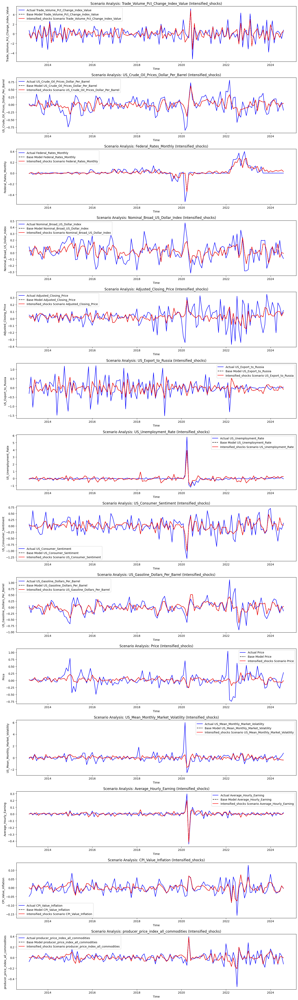

In [74]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.varmax import VARMAX

# Step 1: Define different scenarios for the exogenous variables
def create_scenario(exog_data, scenario_type):
    scenario_exog = exog_data.copy()
    if scenario_type == "no_shocks":
        # Scenario 1: Complete removal of shocks
        scenario_exog['Russia_Ukraine_Date_Flag'] = 0
        scenario_exog['Covid_Flag'] = 0
    elif scenario_type == "prolonged_shocks":
        # Scenario 2: Prolonged impact of shocks
        # Extend the shock period by setting flags to 1 for an extended range
        scenario_exog['Russia_Ukraine_Date_Flag'] = (
            (scenario_exog.index >= pd.Timestamp('2022-02-01')) & 
            (scenario_exog.index <= pd.Timestamp('2023-12-31'))
        ).astype(int)
        scenario_exog['Covid_Flag'] = (
            (scenario_exog.index >= pd.Timestamp('2020-01-20')) & 
            (scenario_exog.index <= pd.Timestamp('2024-12-31'))
        ).astype(int)
    elif scenario_type == "intensified_shocks":
        # Scenario 3: Intensified shocks
        scenario_exog['Russia_Ukraine_Date_Flag'] *= 2
        scenario_exog['Covid_Flag'] *= 2
    return scenario_exog

# Step 2: Perform scenario analysis
def perform_scenario_analysis(varx_model, endog_data, exog_data, scenario_type):
    # Create the scenario
    scenario_exog = create_scenario(exog_data, scenario_type)
    
    # Re-fit the VARX model with the scenario exogenous variables
    scenario_model = VARMAX(endog_data, exog=scenario_exog, order=(optimal_lag, 0)).fit(disp=False, maxiter=10000, method='powell')
    
    # Generate predictions for the scenario
    scenario_predictions = scenario_model.fittedvalues
    
    # Return the scenario predictions
    return scenario_predictions

# Step 3: Plot and compare results
def plot_scenario_analysis(endog_data, base_predictions, scenario_predictions, scenario_type):
    fig, axes = plt.subplots(nrows=len(endog_data.columns), figsize=(15, 50))
    for i, column in enumerate(endog_data.columns):
        axes[i].plot(endog_data.index, endog_data[column], label=f"Actual {column}", color="blue")
        axes[i].plot(base_predictions.index, base_predictions[column], label=f"Base Model {column}", color="black", linestyle="--")
        axes[i].plot(scenario_predictions.index, scenario_predictions[column], label=f"{scenario_type.capitalize()} Scenario {column}", color="red")
        axes[i].set_title(f"Scenario Analysis: {column} ({scenario_type.capitalize()})")
        axes[i].set_xlabel("Time")
        axes[i].set_ylabel(column)
        axes[i].legend()
    
    plt.tight_layout()
    plt.show()

# Step 4: Run scenario analysis for different scenarios
# Generate base model predictions
base_predictions = varx_model.fittedvalues

# Scenario 1: No Shocks
no_shocks_predictions = perform_scenario_analysis(varx_model, endog_data, exog_data, "no_shocks")
plot_scenario_analysis(endog_data, base_predictions, no_shocks_predictions, "no_shocks")

# Scenario 2: Prolonged Shocks
prolonged_shocks_predictions = perform_scenario_analysis(varx_model, endog_data, exog_data, "prolonged_shocks")
plot_scenario_analysis(endog_data, base_predictions, prolonged_shocks_predictions, "prolonged_shocks")

# Scenario 3: Intensified Shocks
intensified_shocks_predictions = perform_scenario_analysis(varx_model, endog_data, exog_data, "intensified_shocks")
plot_scenario_analysis(endog_data, base_predictions, intensified_shocks_predictions, "intensified_shocks")
